# Домашняя работа к теме:  
## Улучшение качества модели. Продвинутые алгоритмы классификации.

In [25]:
from sklearn.datasets import load_boston
import pandas as pd
data =  pd.read_csv(load_boston()['filename'], skiprows=1)

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

---

## EDA & FE aka варим фичи

In [78]:
print(load_boston()['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

Фактор Значение  
CRIM   Уровень преступности (Crime rate)  
ZN	   Доля участков площадью более 25 000 кв. футов, занятых жилыми помещениями  (Percentage of residential land zoned for lots over 25,000 ft2)  
INDUS	Доля территории, занятой бизнес-структурами, кроме розничной торговли (Percentage of land occupied by nonretail business)  
CHAS	Наличие выхода к реке Чарльз (1 или 0) (Does tract bound Charles River (= 1 if tract bounds river, = 0 otherwise))  
NOX	Концентрация оксида азота (частиц на 10 миллионов ед.) (Nitric oxide concentration (parts per 10 million))  
RM  Среднее количество комнат в доме (Average number of rooms per dwelling)  
AGE	Процент жилья постройки до 1940 года, занимаемых собственником (Percentage of owner-occupied units built prior to 1940)  
DIS	Взвешенные расстояния до пяти бостонских центров занятости (Weighted distances to five Boston employment centers)  
RAD	Индекс доступности радиальных магистралей (Index of accessibility to radial highways)  
TAX	Ставка налога на стоимость имущества (за 10 000 долларов США) (Full-value property tax rate per 10,000)  
PTRATIO Соотношение численности учащихся и преподавателей (Pupil-to-teacher ratio by town)  
LSTAT	 Процент населения с низким социальным статусом (Percentage of lower status of the population)  
B: Это рассчитывается как 1000(Bk — 0.63)², где Bk -
 доля лиц афроамериканского происхождения по городу  
MEDV  Средняя (медианная) стоимость домов, занимаемых владельцами, в $ 1000 (MEDV Median value of owner-occupied homes in 1000s)

In [28]:
type(data)

pandas.core.frame.DataFrame

In [29]:
data.tail()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0
505,0.04741,0.0,11.93,0,0.573,6.030,80.8,2.5050,1,273,21.0,396.90,7.88,11.9


In [30]:
data.shape

(506, 14)

In [31]:
data.keys()

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(11), int64(3)
memory usage: 55.5 KB


In [33]:
data.describe(include='all')

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677082,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [34]:
data.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

In [12]:
import pandas_profiling
data.profile_report()

Приметим, что атрибуты 'TAX' и 'RAD' сильно скоррелированы (согласно отчёту высветилось в предупреждениях). Один из атрибутов впоследствии можно удалить (ниже я ещё раз отдельно вычислю матрицу корреляции и приведу тепловую карту).

Из data.describe можно обнаружить, например для атрибута CRIM сильные выбросы. Это например видно, если посмотреть среднее значение и минимум с максимумом.

In [35]:
import statistics
print(statistics.mean(data['CRIM']))
print(min(data['CRIM']))
print(max(data['CRIM']))

3.613523557312253
0.00632
88.9762


Видно, что несколько значений имеют намного большие значения, чем большинство. Так можно сказать и о других атрибутах. Нарисуем ящик с усами двумя способами.

1-й способ

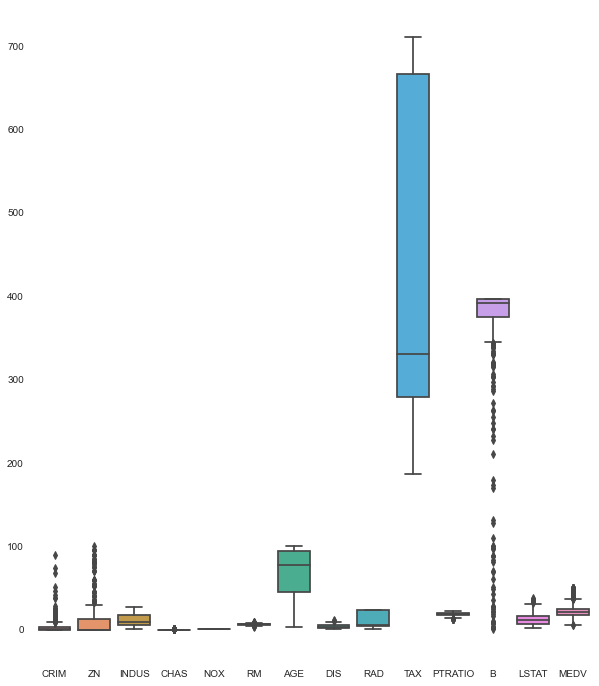

In [36]:
plt.figure(figsize=(10, 12))
sns.boxplot(data=data)

2-й способ (каждый отдельно, в цикле, и горизонтально)

In [37]:
data.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

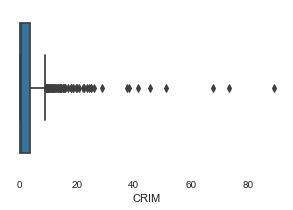

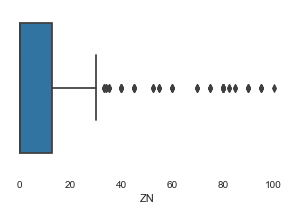

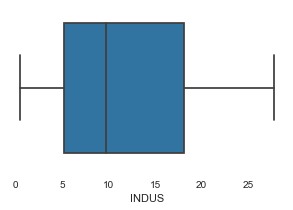

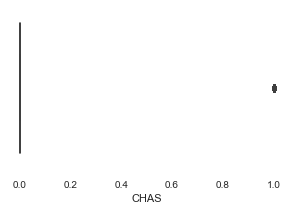

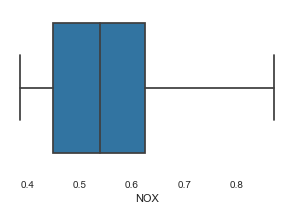

...

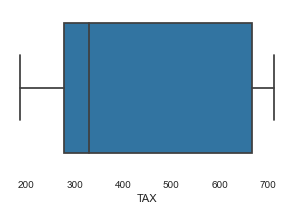

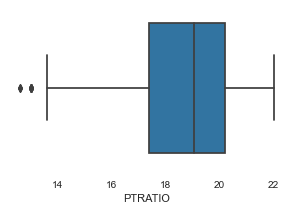

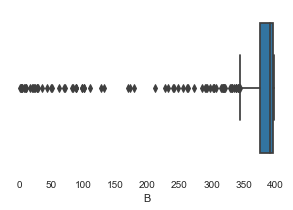

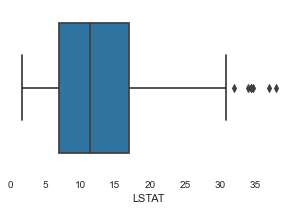

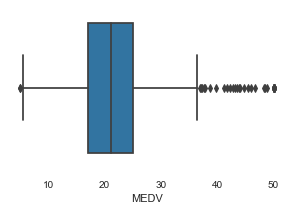

In [38]:
for i in data.columns:
    plt.figure(figsize=(5,3))
    sns.boxplot(x=data[i])

Видно, что много переменных нуждаются в чистке. Сделаем копию данных, и у нас будут два датафрейма. Первоначальный и, скажем так, учебный.

In [63]:
boston=data.copy()

Пока, что находится выше по строчкам, относится, как к датафрейму boston, так и датафрейму data. **Будем производить учебный feature engineering над датафреймом boston**.

В следующем блоке заменим выходящие за определённые границы данные nan значением, и посчитаем количество.

In [64]:
for i in boston.columns:
    q75,q25=np.percentile(boston.loc[:,i],[75,25])
    iqr=q75-q25
    min=q25-(iqr*1.5)
    max=q75+(iqr*1.5)
    boston.loc[boston.loc[:,i]<min,i]=np.nan
    boston.loc[boston.loc[:,i]>max,i]=np.nan
    print(i, ', отсутствующих значений:', boston.loc[:,i].isnull().sum())

CRIM , отсутствующих значений: 66
ZN , отсутствующих значений: 68
INDUS , отсутствующих значений: 0
CHAS , отсутствующих значений: 35
NOX , отсутствующих значений: 0
RM , отсутствующих значений: 30
AGE , отсутствующих значений: 0
DIS , отсутствующих значений: 5
RAD , отсутствующих значений: 0
TAX , отсутствующих значений: 0
PTRATIO , отсутствующих значений: 15
B , отсутствующих значений: 77
LSTAT , отсутствующих значений: 7
MEDV , отсутствующих значений: 40


Для некоторых атрибутов не было выбросов, вот и по-прежнему для этих атрибутов нет отсутствующих значений. Но, следующим шагом заменим образовавшиеся nan среднем значением атрибута.

### Заполнение отсутствующих  значений.

In [65]:
#Вычислим отсутствующие значения для каждого атрибута.
cdf=pd.DataFrame(boston.isnull().sum())
cdf=cdf.sort_values(0, ascending=False)
cdf=cdf.rename(columns={0:'отсутствующие значения'})
print(cdf)

         отсутствующие значения
B                            77
ZN                           68
CRIM                         66
MEDV                         40
CHAS                         35
RM                           30
PTRATIO                      15
LSTAT                         7
DIS                           5
INDUS                         0
NOX                           0
AGE                           0
RAD                           0
TAX                           0


In [66]:
#Замена всех выброшенных значений средними значениями датасета boston
#Среднее теперь не учитывает те самые выброшенные значения
for i in boston.columns:
    boston[i]=boston[i].fillna(boston[i].mean())

Убедимся, что нет теперь nan значений.

In [67]:
boston.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

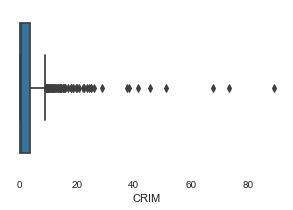

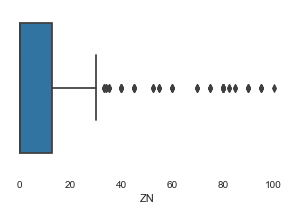

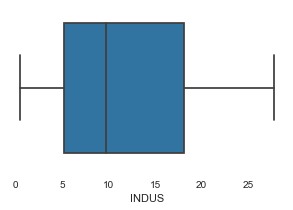

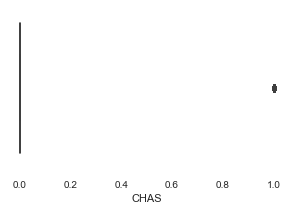

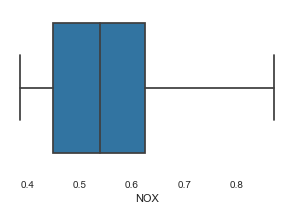

...

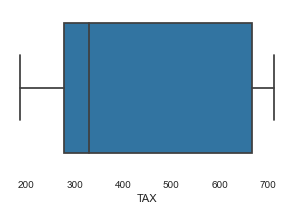

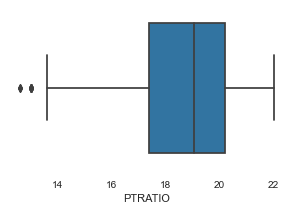

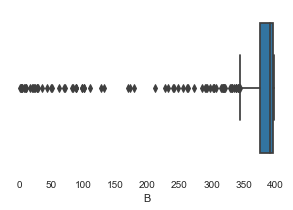

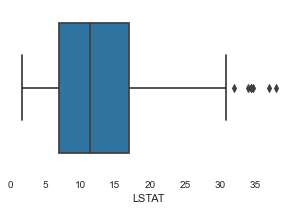

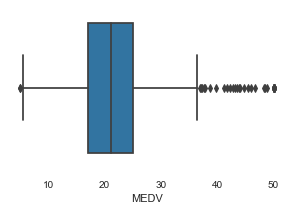

In [68]:
for i in boston.columns:
    plt.figure(figsize=(5,3))
    sns.boxplot(x=data[i])

In [69]:
boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


На примере атрибута 'CRIM' видно, что максимальное значение уменьшилось на порядок и мы тем самым ещё не учитываем часть домов, где наверняка дома стоят весьма (считай, нелинейно) дешёво, чем дома в более-менее спокойных районах.

## Рассчитаем матрицу корреляций Пирсона и построим тепловую карту.

### Сначала для первоначальных (не обработанных) данных.

In [70]:
corr_m = data.corr().round(2)
corr_m

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
CRIM,1.00,-0.20,0.41,-0.06,0.42,-0.22,0.35,-0.38,0.63,0.58,0.29,-0.39,0.46,-0.39
ZN,-0.20,1.00,-0.53,-0.04,-0.52,0.31,-0.57,0.66,-0.31,-0.31,-0.39,0.18,-0.41,0.36
INDUS,0.41,-0.53,1.00,0.06,0.76,-0.39,0.64,-0.71,0.60,0.72,0.38,-0.36,0.60,-0.48
CHAS,-0.06,-0.04,0.06,1.00,0.09,0.09,0.09,-0.10,-0.01,-0.04,-0.12,0.05,-0.05,0.18
NOX,0.42,-0.52,0.76,0.09,1.00,-0.30,0.73,-0.77,0.61,0.67,0.19,-0.38,0.59,-0.43
RM,-0.22,0.31,-0.39,0.09,-0.30,1.00,-0.24,0.21,-0.21,-0.29,-0.36,0.13,-0.61,0.70
AGE,0.35,-0.57,0.64,0.09,0.73,-0.24,1.00,-0.75,0.46,0.51,0.26,-0.27,0.60,-0.38
DIS,-0.38,0.66,-0.71,-0.10,-0.77,0.21,-0.75,1.00,-0.49,-0.53,-0.23,0.29,-0.50,0.25
RAD,0.63,-0.31,0.60,-0.01,0.61,-0.21,0.46,-0.49,1.00,0.91,0.46,-0.44,0.49,-0.38
TAX,0.58,-0.31,0.72,-0.04,0.67,-0.29,0.51,-0.53,0.91,1.00,0.46,-0.44,0.54,-0.47


Наша цель это 'MEDV'. Из расчёт коэффициента Пирсона видно, что атрибут 'RM' коррелирует с 'MEDV'.
Нарисуем отдельно график для этих двух величин.

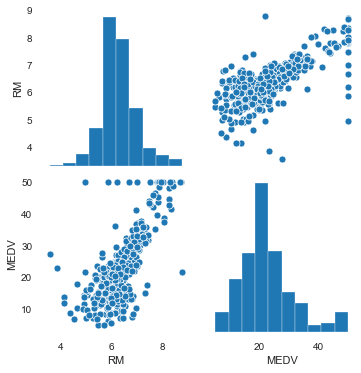

In [71]:
sns_plot = sns.pairplot(
    data[['RM', 'MEDV']])
sns_plot

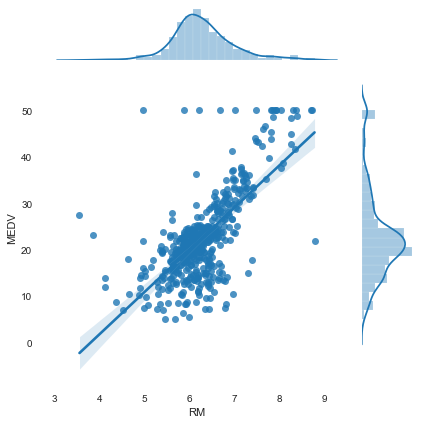

In [72]:
sns.jointplot(x='RM', y='MEDV', 
              data=data, kind='reg')

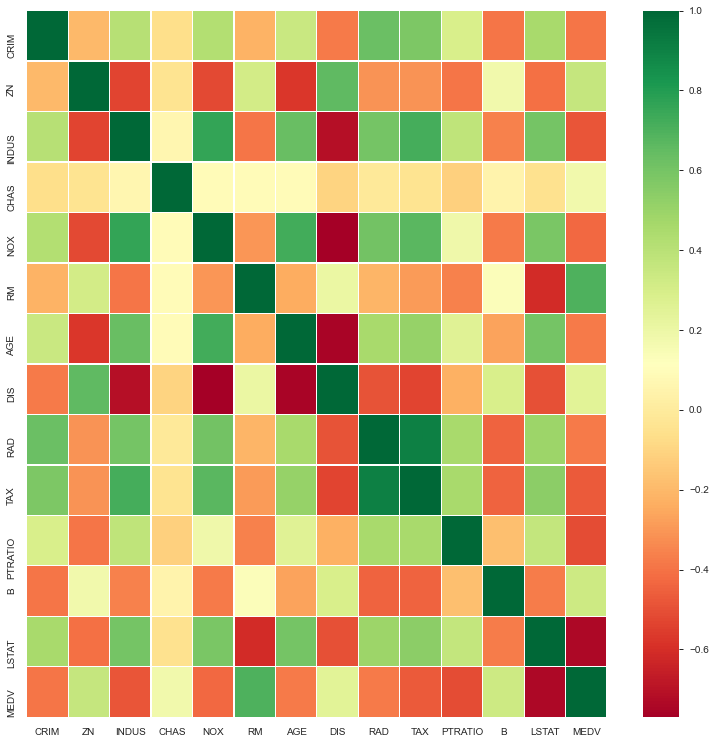

In [73]:
f, ax = plt.subplots(figsize=(13, 13))
corr = np.round_(data.corr(), decimals=2)
sns.heatmap(corr,annot=False,cmap='RdYlGn',linewidths=0.2)

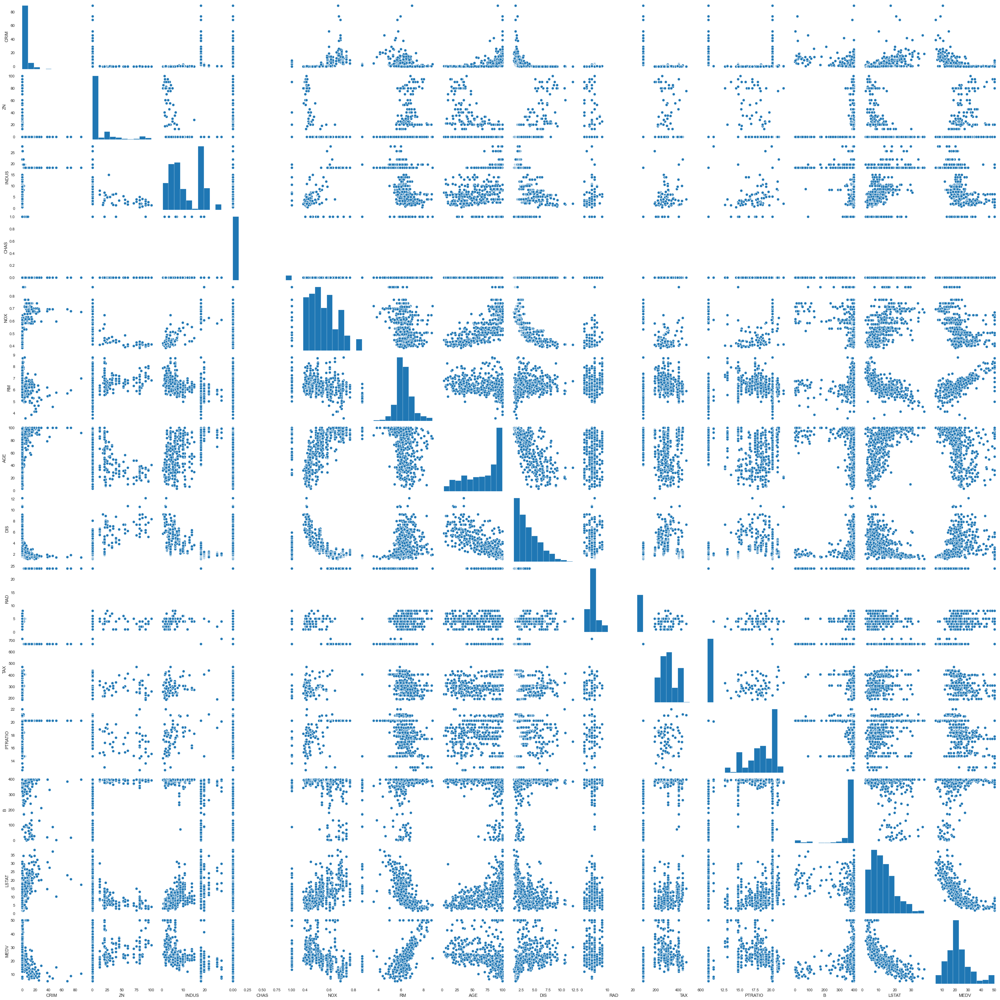

In [74]:
sns.pairplot(data)

### Для датасета boston

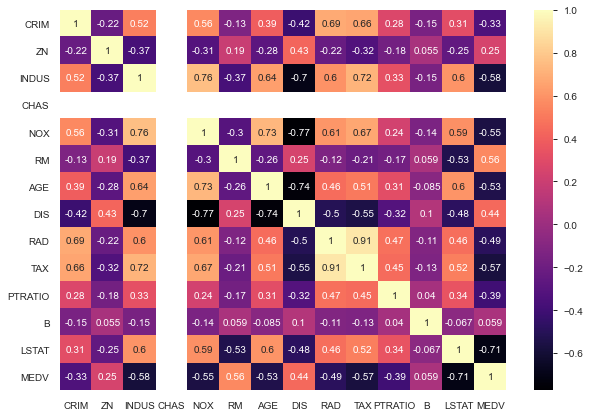

In [75]:
#Проверим корреляцию между переменными и удалим наиболее коррелированные.
#А ещё для датафрейма boston совместим расчёт и визуализацию.
plt.figure(figsize=(10,7))
sns.heatmap(boston.corr(), annot=True,cmap='magma')
#corr_m_boston = data.corr().round(2)
#corr_m_boston

Как и показало предупреждение, так и по карте видно, что RAD и TAX высоко скоррелированы. Ставку налога удалим, доступность магистралей оставим. Доступность важнее знать, чем какие-то дополнительные экономические штучки, как обывателю. Но, видимо налог и вычисляется по доступности жилья для автотранспорта.

In [76]:
boston=boston.drop('TAX', axis=1)

In [77]:
boston.shape

(506, 13)

---

# Модели, гиперпараметры, качество.

In [82]:
from sklearn.preprocessing import StandardScaler

### [LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

In [58]:
from sklearn.linear_model import LinearRegression

In [96]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

Обучим нашу модель на всех столбцах, кроме неё самой. Cтолбец 'MEDV' - наша целевая функция.

In [80]:
X_train, X_test, y_train, y_test = train_test_split(boston.drop(columns=['MEDV']), boston.MEDV, test_size=0.25)


In [83]:
StSc = StandardScaler()
X_train = StSc.fit_transform(X_train)
X_test = StSc.transform(X_test)

In [101]:
LR = LinearRegression()
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
print('\nЦена дома в тестовой выборке, реальная, предсказанная и отклонение:')
pd.DataFrame({'True': y_test.round(2), 'Predicted': y_pred.round(2), 'Deviation, %': (y_pred - y_test)/y_test}).round(2)


Цена дома в тестовой выборке, реальная, предсказанная и отклонение:


,True,Predicted,"Deviation, %"
413,16.3,11.44,-0.30
164,22.7,20.39,-0.10
471,19.6,18.19,-0.07
469,20.1,15.98,-0.21
176,23.2,23.24,0.00
...,...,...,...
379,10.2,14.35,0.41
326,23.0,23.98,0.04
243,23.7,27.00,0.14
462,19.5,18.22,-0.07


In [102]:
print('\nМетрики модели:\n')
print('MSE:', mean_squared_error(y_test, y_pred).round(4))
print('MAE:', mean_absolute_error(y_test, y_pred).round(4))


Метрики модели:

MSE: 16.3034
MAE: 3.106


### [RandomForestRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html)

In [108]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

In [109]:
params = {   'n_estimators': list(range(5, 100, 1)),
             'criterion': ['mse', 'mae'],
             'max_depth': list(range(5, 30, 1)),
             'min_samples_split': list(range(2, 20, 1)),
             'min_samples_leaf': list(range(1, 20, 1)), 
             'max_features': ['auto', 'sqrt', 'log2'],
             'n_jobs': [-1],
             'random_state': [0]}

RFR = RandomizedSearchCV(RandomForestRegressor(), params, cv=10, n_jobs=-1, n_iter=10)
RFR =  RFR.fit(X_train, y_train).best_estimator_

##### Оптимальные гиперпараметры после рандомного поиска нашей модели:

In [110]:
RFR

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=22, max_features='log2', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=5,
                      min_samples_split=5, min_weight_fraction_leaf=0.0,
                      n_estimators=43, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

**Для оптимальных гиперпараметров модели оценим качество:**

In [112]:
y_pred = RFR.predict(X_test)
print('\nЦена дома в тестовой выборке, реальная, предсказанная и отклонение:')
pd.DataFrame({'True': y_test.round(2), 'Predicted': y_pred.round(2), 'Deviation, %': (y_pred - y_test)/y_test}).round(2)


Цена дома в тестовой выборке, реальная, предсказанная и отклонение:


,True,Predicted,"Deviation, %"
413,16.3,14.66,-0.10
164,22.7,20.95,-0.08
471,19.6,20.30,0.04
469,20.1,19.70,-0.02
176,23.2,22.21,-0.04
...,...,...,...
379,10.2,12.00,0.18
326,23.0,24.17,0.05
243,23.7,23.50,-0.01
462,19.5,19.80,0.02


In [113]:
print('\nМетрики модели:\n')
print('MSE:', mean_squared_error(y_test, y_pred).round(4))
print('MAE:', mean_absolute_error(y_test, y_pred).round(4))


Метрики модели:

MSE: 12.502
MAE: 2.5958


### [AdaBoostRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html)


In [114]:
from sklearn.ensemble import AdaBoostRegressor

In [115]:
params = {  'base_estimator': [LinearRegression()],
            'n_estimators': list(range(5,100,1)), 
            'learning_rate': [0.001, 0.01, 0.1, 1, 10],
            'loss': ['linear','square','exponential'],
            'random_state': [0]}

ABR = RandomizedSearchCV(AdaBoostRegressor(), params, cv = 10, n_jobs=-1, n_iter=10)
ABR = ABR.fit(X_train, y_train).best_estimator_

##### Оптимальные гиперпараметры после рандомного поиска нашей модели:

In [116]:
ABR

AdaBoostRegressor(base_estimator=LinearRegression(copy_X=True,
                                                  fit_intercept=True,
                                                  n_jobs=None,
                                                  normalize=False),
                  learning_rate=0.001, loss='square', n_estimators=99,
                  random_state=0)

**Для оптимальных гиперпараметров модели оценим качество:**

In [117]:
y_pred = ABR.predict(X_test)
print('\nЦена дома в тестовой выборке, реальная, предсказанная и отклонение:')
pd.DataFrame({'True': y_test.round(2), 'Predicted': y_pred.round(2), 'Deviation, %': (y_pred - y_test)/y_test}).round(2)


Цена дома в тестовой выборке, реальная, предсказанная и отклонение:


,True,Predicted,"Deviation, %"
413,16.3,11.46,-0.30
164,22.7,20.36,-0.10
471,19.6,18.09,-0.08
469,20.1,15.80,-0.21
176,23.2,23.25,0.00
...,...,...,...
379,10.2,14.24,0.40
326,23.0,23.92,0.04
243,23.7,27.01,0.14
462,19.5,18.13,-0.07


In [118]:
print('\nМетрики модели:\n')
print('MSE:', mean_squared_error(y_test, y_pred).round(4))
print('MAE:', mean_absolute_error(y_test, y_pred).round(4))


Метрики модели:

MSE: 16.1849
MAE: 3.0958


### [KNeighborsRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html)

In [132]:
from sklearn.neighbors import DistanceMetric

In [130]:
from sklearn.neighbors import KNeighborsRegressor

In [131]:
from sklearn.model_selection import StratifiedShuffleSplit

In [135]:
params = {   'n_neighbors': list(range(3,30,1)),
             'weights': ['uniform', 'distance'],
             'algorithm': ['brute'],
             'leaf_size': list(range(5,50,1)),
             'p': [1, 2],
             'metric': ['euclidian','manhattan','chebyshev','minkowski']}
  
cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

KNR = RandomizedSearchCV(KNeighborsRegressor(), params, n_jobs=-1,  random_state=0, n_iter=10)
KNR = KNR.fit(X_train, y_train).best_estimator_

##### Оптимальные гиперпараметры после рандомного поиска нашей модели:

In [136]:
KNR

KNeighborsRegressor(algorithm='brute', leaf_size=27, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=7, p=1,
                    weights='distance')

**Для оптимальных гиперпараметров модели оценим качество:**

In [139]:
y_pred = KNR.predict(X_test)
print('\nЦена дома в тестовой выборке, реальная, предсказанная и отклонение:')
pd.DataFrame({'True': y_test.round(2), 'Predicted': y_pred.round(2), 'Deviation, %': (y_pred - y_test)/y_test}).round(2)


Цена дома в тестовой выборке, реальная, предсказанная и отклонение:


,True,Predicted,"Deviation, %"
413,16.3,13.37,-0.18
164,22.7,22.72,0.00
471,19.6,20.36,0.04
469,20.1,18.99,-0.06
176,23.2,25.77,0.11
...,...,...,...
379,10.2,9.75,-0.04
326,23.0,23.27,0.01
243,23.7,23.45,-0.01
462,19.5,19.05,-0.02


In [140]:
print('\nМетрики модели:\n')
print('MSE:', mean_squared_error(y_test, y_pred).round(4))
print('MAE:', mean_absolute_error(y_test, y_pred).round(4))


Метрики модели:

MSE: 11.5357
MAE: 2.5227


---

## Общий вывод:  
Оптимальное качество для датасета boston (цена недвижимости в Бостоне) после подбора гиперпараметров показала модель KNeighborsRegressor.  
Неплохое качество имеет также модель RandomForestRegressor.